In [36]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [37]:
import planetary_computer as pc
from pystac_client import Client
import pandas as pd
import numpy as np
import geopy.distance as distance
from datetime import timedelta
from time import time
import matplotlib.pyplot as plt

import rioxarray
from IPython.display import Image
from PIL import Image as PILImage

from pyproj import Transformer


import geopandas as gpd
from shapely.geometry import Point
from pyproj import CRS, Transformer
from pathlib import Path
import json
import warnings
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import rioxarray
import rasterio
from matplotlib.colors import ListedColormap, BoundaryNorm
# Need the Planetary Computer client (pc) for signing assets, assuming it's imported elsewhere
import planetary_computer as pc # Explicitly import pc if not globally available

# Need the Planetary Computer client (pc) for signing assets, assuming it's imported elsewhere
# If not, add: import pystac_client; import planetary_computer as pc 

## Suppress warnings
#warnings.filterwarnings('ignore', message='The given provided crs is not equal to the raster crs')


In [38]:
'''
def get_bounding_box(latitude, longitude, meter_buffer=50000):
    """
    Given a latitude, longitude, and buffer in meters, returns a bounding
    box around the point with the buffer on the left, right, top, and bottom.

    Returns a list of [minx, miny, maxx, maxy]
    """
    distance_search = distance.distance(meters=meter_buffer)

    # calculate the lat/long bounds based on ground distance
    # bearings are cardinal directions to move (south, west, north, and east)
    min_lat = distance_search.destination((latitude, longitude), bearing=180)[0]
    min_long = distance_search.destination((latitude, longitude), bearing=270)[1]
    max_lat = distance_search.destination((latitude, longitude), bearing=0)[0]
    max_long = distance_search.destination((latitude, longitude), bearing=90)[1]

    return [min_long, min_lat, max_long, max_lat]
'''
def get_bounding_box(latitude, longitude, meter_buffer=50000):
    """
    Given a latitude, longitude, and buffer in meters, returns a bounding
    box [min_lon, min_lat, max_lon, max_lat] around the point.
    
    Uses pyproj.Geod to calculate accurate geodesic coordinates.
    """
    # WGS84 ellipsoid
    g = Geod(ellps='WGS84')

    # Calculate points in cardinal directions
    # fwd returns: (lon, lat, back_azimuth)
    
    # North (0 degrees)
    lon_north, lat_north, _ = g.fwd(longitude, latitude, 0, meter_buffer)
    # South (180 degrees)
    lon_south, lat_south, _ = g.fwd(longitude, latitude, 180, meter_buffer)
    # East (90 degrees)
    lon_east, lat_east, _ = g.fwd(longitude, latitude, 90, meter_buffer)
    # West (270 degrees)
    lon_west, lat_west, _ = g.fwd(longitude, latitude, 270, meter_buffer)

    # Construct the box [min_x, min_y, max_x, max_y]
    # Note: We use the specific calculated lats/lons to ensure the buffer covers the distance
    return [lon_west, lat_south, lon_east, lat_north]

def get_date_range(date, time_buffer_days=15):
    """Get a date range to search for in the planetary computer based
    on a sample's date. The time range will include the sample date
    and time_buffer_days days prior

    Returns a string"""
    datetime_format = "%Y-%m-%d"
    range_start = pd.to_datetime(date) - timedelta(days=time_buffer_days)
    range_end = pd.to_datetime(date) + timedelta(days=time_buffer_days)
    date_range = f"{range_start.strftime(datetime_format)}/{range_end.strftime(datetime_format)}"

    return date_range


def extract_and_save_tile(
    item,
    points_df,
    initial_pixel_size=100,
    save_data=False,
    output_path=None
):
    """
    Extracts, clips, aligns, calculates indices, visualizes individually, and 
    optionally saves a square tile around a set of reference points.
    All plots will now have a consistent 'origin='upper'' display.

    Args:
        item (pystac.Item): The selected Sentinel-2 STAC item.
        points_df (pd.DataFrame): DataFrame with 'lat' and 'lon' columns.
        initial_pixel_size (int): The initial square tile dimension (in pixels)
                                  at the 10m resolution.
        save_data (bool): If True, saves the data to disk.
        output_path (str | Path, optional): Directory to save the output data.
    """
    # --- 1. Setup and Bounding Box Calculation ---
    print("--- Starting Tile Extraction and Processing ---")
    
    target_crs = CRS.from_string(item.properties["proj:code"])
    center_lat = points_df['lat'].mean()
    center_lon = points_df['lon'].mean()
    print(f"Center Point (Lat/Lon): ({center_lat:.4f}, {center_lon:.4f})")
    
    initial_side_meters = initial_pixel_size * 10
    
    # Calculate bounding box in UTM meters
    points_gdf = gpd.GeoDataFrame(
        points_df, 
        geometry=gpd.points_from_xy(points_df.lon, points_df.lat), 
        crs=CRS.from_string("EPSG:4326")
    ).to_crs(target_crs)
    
    minx_points, miny_points, maxx_points, maxy_points = points_gdf.total_bounds
    center_x = (minx_points + maxx_points) / 2
    center_y = (miny_points + maxy_points) / 2
    required_margin_meters = max(maxx_points - minx_points, maxy_points - miny_points) / 2
    final_margin_meters = max(initial_side_meters / 2, required_margin_meters)
    
    min_x_final = center_x - final_margin_meters
    max_x_final = center_x + final_margin_meters
    min_y_final = center_y - final_margin_meters
    max_y_final = center_y + final_margin_meters
    
    final_pixel_side = int((max_x_final - min_x_final) / 10)
    print(f"Final Tile Dimension (10m pixels): {final_pixel_side} x {final_pixel_side}")
    
    clip_bbox_utm = (min_x_final, min_y_final, max_x_final, max_y_final)
    transformer_latlon_to_utm = Transformer.from_crs(CRS.from_string("EPSG:4326"), target_crs, always_xy=True)
    
    # --- 2. Asset Clipping and ALIGNMENT using reproject_match() ---
    
    band_gsd_map = {
        "B02": 10, "B03": 10, "B04": 10, "B08": 10, "visual": 10,
        "B05": 20, "B06": 20, "B07": 20, "B8A": 20, "SCL": 20,
        "AOT": 10, "B01": 60, "B09": 60, "B11": 20, "B12": 20,
        "WVP" : 60
    }
    
    clipped_data = {}
    print("--- Clipping and Aligning Rasters ---")
    
    # 2a. Load and Clip B04 to serve as the reference grid
    b04_href = pc.sign(item.assets["B04"].href)
    b04_ds = rioxarray.open_rasterio(b04_href)
    b04_clip = b04_ds.rio.clip_box(
        minx=clip_bbox_utm[0], miny=clip_bbox_utm[1], 
        maxx=clip_bbox_utm[2], maxy=clip_bbox_utm[3],
        crs=target_crs
    )
    # Ensure final pixel size (cleanup)
    b04_clip = b04_clip.isel(y=slice(0, final_pixel_side), x=slice(0, final_pixel_side))
    
    # Store the B04 reference (squeezed for 2D calculations later)
    clipped_data["B04"] = b04_clip.squeeze() 
    print(f"Clipped B04 (Reference): Shape {b04_clip.shape}")

    # 2b. Process and align all other bands
    for asset_key, gsd in band_gsd_map.items():
        if asset_key == "B04":
            continue
            
        asset_href = pc.sign(item.assets[asset_key].href)
        ds = rioxarray.open_rasterio(asset_href)
        
        # Clip band to the UTM bounding box
        ds_clip = ds.rio.clip_box(
            minx=clip_bbox_utm[0], miny=clip_bbox_utm[1], 
            maxx=clip_bbox_utm[2], maxy=clip_bbox_utm[3],
            crs=target_crs
        )

        # Reproject/resample to MATCH the B04 reference grid exactly
        resampling_method = rasterio.enums.Resampling.nearest if asset_key == "SCL" else rasterio.enums.Resampling.bilinear

        ds_aligned = ds_clip.rio.reproject_match(
            b04_clip, 
            resampling=resampling_method
        )
        
        # Store the aligned DataArray (squeeze single-band rasters to 2D)
        if asset_key != "visual":
            clipped_data[asset_key] = ds_aligned.squeeze()
        else:
             clipped_data[asset_key] = ds_aligned
             
        print(f"Clipped {asset_key}: Shape {ds_aligned.shape}")


    # --- 3. Calculate Spectral Indices (NDVI and NDCI) ---
    SCALE_FACTOR = 10000.0 
    
    # Get relevant DataArrays and convert to floating-point reflectance
    b04_ref = (clipped_data["B04"] / SCALE_FACTOR).astype(np.float32)
    b05 = (clipped_data["B05"] / SCALE_FACTOR).astype(np.float32)
    b07 = (clipped_data["B07"] / SCALE_FACTOR).astype(np.float32)
    b08 = (clipped_data["B08"] / SCALE_FACTOR).astype(np.float32)
    
    # Calculate NDVI: (B08 - B04) / (B08 + B04)
    sum_b8_b4 = b08 + b04_ref
    # Use np.nan instead of 0 for invalid calculations
    ndvi = (b08 - b04_ref) / sum_b8_b4.where(sum_b8_b4 != 0, np.nan) 
    
    # Calculate NDCI: (B07 - B05) / (B07 + B05)
    sum_b7_b5 = b07 + b05
    ndci = (b07 - b05) / sum_b7_b5.where(sum_b7_b5 != 0, np.nan) 
    
    # Replace B04 with its scaled/float version and add indices
    clipped_data["B04"] = b04_ref 
    clipped_data["NDVI"] = ndvi
    clipped_data["NDCI"] = ndci
    print(f"Calculated NDVI: Shape {ndvi.shape} (Range -1.0 to 1.0)")
    print(f"Calculated NDCI: Shape {ndci.shape} (Range -1.0 to 1.0)")
    
    # --- 4. Optional: Saving Data ---
    if save_data:
        output_dir = Path(output_path)
        output_dir.mkdir(parents=True, exist_ok=True)
        
        # Prepare SCL Colormap for saving
        colors = ['white', 'white', 'black', 'black', 'green', 'saddlebrown', 'lightblue', 'grey', 'grey', 'grey', 'grey']
        cmap_scl = ListedColormap(colors)
        
        # a) Save the cropped GeoTIFFs (including indices)
        for key, da in clipped_data.items():
            tif_path = output_dir / f"{key}_raw.tif"
            da.rio.to_raster(tif_path)

            png_path = output_dir / f"{key}_preview.png"
            data_values = da.values

            # Handle different types of bands for visualization
            if key == "visual":
                # RGB Image: Normalize and save
                # visual is often 0-255 already, but sometimes needs robust scaling if 16-bit
                if data_values.max() > 255:
                    # Simple robust scaling for 16-bit RGB
                    vmin, vmax = np.nanpercentile(data_values, [2, 98])
                    plt.imsave(png_path, np.moveaxis(data_values, 0, -1), vmin=vmin, vmax=vmax, origin='upper')
                else:
                    plt.imsave(png_path, np.moveaxis(data_values, 0, -1).astype(np.uint8), origin='upper')

            elif key == "SCL":
                # Categorical: Use the custom colormap
                # imsave handles the mapping of integers to colors via cmap
                plt.imsave(png_path, data_values, cmap=cmap_scl, vmin=0, vmax=11, origin='upper')

            elif key in ["NDVI", "NDCI"]:
                # Indices: Use specific colormaps and fixed -1 to 1 range
                cmap = "RdYlGn" if key == "NDVI" else "jet" # or 'cool'
                plt.imsave(png_path, data_values, cmap=cmap, vmin=-1, vmax=1, origin='upper')

            else:
                # Single Spectral Bands (B02, B04, etc.): Grayscale
                # Apply robust auto-contrast (2% to 98% percentile)
                vmin, vmax = np.nanpercentile(data_values, [2, 98])
                plt.imsave(png_path, data_values, cmap='gray', vmin=vmin, vmax=vmax, origin='upper')

        # b) Save metadata 
        metadata = {
            "item_id": item.id,
            "tile_size_10m_pixels": final_pixel_side,
            "center_lat": center_lat,
            "center_lon": center_lon,
            "points_data": points_df[['lat', 'lon']].to_dict('records')
        }
        with open(output_dir / "metadata.json", "w") as f:
            json.dump(metadata, f, indent=4)
        
        print(f"\nData successfully saved to: {output_dir.resolve()}")

    # --- 5. Individual Visualization (Big Images with consistent origin='upper') ---
    
    point_x, point_y = transformer_latlon_to_utm.transform(points_df.lon.values, points_df.lat.values)
    
    # Custom SCL colormap 
    colors = ['white', 'white', 'black', 'black', 'green', 'saddlebrown', 'lightblue', 'grey', 'grey', 'grey', 'grey']
    cmap_scl = ListedColormap(colors)
    bounds = np.arange(12)
    norm_scl = BoundaryNorm(bounds, cmap_scl.N) 
    
    # Define all 12 assets to plot
    assets_to_plot = {
        "visual": ("True Color (RGB)", None, None, False, None, None),
        "B02": ("Band 2 (Blue)", "gray", None, True, None, None),
        "B03": ("Band 3 (Green)", "gray", None, True, None, None),
        "B04": ("Band 4 (Red)", "gray", None, True, None, None),
        "B08": ("Band 8 (NIR)", "gray", None, True, None, None),
        "B05": ("Band 5 (Red Edge 1)", "gray", None, True, None, None),
        "B06": ("Band 6 (Red Edge 2)", "gray", None, True, None, None),
        "B07": ("Band 7 (Red Edge 3)", "gray", None, True, None, None),
        "B8A": ("Band 8A (Red Edge 4)", "gray", None, True, None, None),
        "SCL": ("Scene Classification (SCL)", cmap_scl, norm_scl, False, None, None),
        "NDVI": ("NDVI (Vegetation)", "RdYlGn", None, True, -1, 1),
        "NDCI": ("NDCI (Chlorophyll)", "jet", None, True, -1, 1)
    }

    for band_key, (title, cmap, norm, add_colorbar, vmin, vmax) in assets_to_plot.items():
        da = clipped_data[band_key]
        
        fig, ax = plt.subplots(figsize=(15, 15))
        
        # Get the extent for correct plotting and point overlay
        # Note: rioxarray's plot.imshow for single bands often flips Y. 
        # Using extent explicitly with origin='upper' ensures consistency.
        extent = [da.x.min(), da.x.max(), da.y.min(), da.y.max()]
        
        if band_key == "visual":
            # For RGB, rioxarray's plot.imshow already handles origin='upper' by default.
            da.plot.imshow(ax=ax, rgb="band", robust=True)
        else:
            # Logic: If vmin/vmax are set, use them and DISABLE robust. 
            # If not set, use robust=True for auto-contrast.
            robust_setting = True if vmin is None else False
            
            da.plot.imshow(
                ax=ax, 
                cmap=cmap, 
                robust=robust_setting, 
                add_colorbar=add_colorbar, 
                origin='upper', 
                extent=extent, 
                norm=norm,
                vmin=vmin,
                vmax=vmax
            )

        # Overlay points on the plot
        ax.scatter(point_x, point_y, c='red', s=100, marker='x', linewidths=2.5)
        
        ax.set_title(f"{title} - Item ID: {item.id}", fontsize=16)
        ax.set_xlabel("UTM Easting (m)")
        ax.set_ylabel("UTM Northing (m)")
        plt.show()
        
    print("\n--- Individual image plots complete. ---")

### client with planetary computer


In [39]:
catalog = Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1", modifier=pc.sign_inplace
)


### df 

In [40]:
df = pd.read_excel(r"C:\Users\KostasPikounis\OneDrive_Inlecom_Personal\OneDrive - INLECOM\Amfitrite\task2\IWD\tick tick bloom data\junk4.xlsx")
after2017 = df[(df.date >= "2017-01-01")]
high_sev = after2017[(after2017.severity > 4)]
#high_sev = after2017[(after2017.severity <= 1)]
print(df.columns)
print(high_sev.shape)

Index(['uid', 'data_provider', 'region', 'lat', 'lon', 'date', 'time', 'year',
       'month', 'day', 'abun', 'severity', 'distance_to_water_m', 'cyfi class',
       'case', 'case_str', 'cluster_size'],
      dtype='object')
(67, 17)


### select case

In [41]:
high_sev.cluster_size.value_counts().sort_index(ascending=False)

cluster_size
16     2
13     3
11     1
10     1
7      5
6      2
4      3
3      3
2      9
1     38
Name: count, dtype: int64

In [43]:
high_sev[high_sev.cluster_size == 2]

,uid,data_provider,region,lat,lon,date,time,year,month,day,abun,severity,distance_to_water_m,cyfi class,case,case_str,cluster_size
13023,bsjr,Pennsylvania_Department_of_Environmental_Prote...,northeast,41.80497,-76.65939,2017-08-08,14:12:00,2017,8,8,46993.33300,5,0.0,High,1519,1519,2
13314,ftzz,Pennsylvania_Department_of_Environmental_Prote...,northeast,41.73699,-77.26226,2017-08-09,17:30:00,2017,8,9,10771.33300,5,0.0,High,5236,5236,2
13745,ltvs,California_Environmental_Data_Exchange_Network,west,38.30700,-121.79400,2019-11-20,19:35:00,2019,11,20,10090.00000,5,251.0,High,10729,10729,2
13759,lybm,Pennsylvania_Department_of_Environmental_Prote...,northeast,40.11561,-79.53184,2020-09-28,16:10:00,2020,9,28,18019.93300,5,0.0,High,10876,10876,2
13984,osye,Pennsylvania_Department_of_Environmental_Prote...,northeast,41.80497,-76.65939,2018-11-07,16:26:00,2018,11,7,113342.20000,5,0.0,High,13395,13395,2
14037,prcs,Wyoming_Department_of_Environmental_Quality,west,41.89393,-105.72715,2018-08-08,17:15:00,2018,8,8,10462.29375,5,86.0,High,4287,4287,2
14214,slnw,Pennsylvania_Department_of_Environmental_Prote...,northeast,41.03008,-77.65158,2018-10-04,18:30:00,2018,10,4,73413.33300,5,19.0,High,16762,16762,2
14721,ziko,NC_Division_of_Water_Resources_NC_Department_o...,south,36.23000,-76.69000,2019-08-13,0:01:00,2019,8,13,18569.31200,5,317.0,High,1577,1577,2
14742,zqnd,Pennsylvania_Department_of_Environmental_Prote...,northeast,40.11503,-79.53203,2020-09-28,16:22:00,2020,9,28,10016.46700,5,0.0,High,10876,10876,2


In [44]:
#high_sev.sort_values(by = ["abun"], inplace = True, ascending = False)
high_sev.sort_values(by = ["abun"], inplace = True, ascending = True)
high_sev.head(50)[["lat", "lon", "date", "abun", "distance_to_water_m", "case", "case_str", "cluster_size"]]

C:\Users\KostasPikounis\AppData\Local\Temp\ipykernel_23020\848377716.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_sev.sort_values(by = ["abun"], inplace = True, ascending = True)


,lat,lon,date,abun,distance_to_water_m,case,case_str,cluster_size
14742,40.115030,-79.532030,2020-09-28,10016.46700,0.0,10876,10876,2
16452,38.590100,-121.731000,2018-11-23,10025.00000,1838.0,4421,4421,1
13745,38.307000,-121.794000,2019-11-20,10090.00000,251.0,10729,10729,2
15118,36.702500,-121.709000,2019-09-17,10110.00000,939.0,930,930,1
18443,34.406900,-119.517000,2018-01-17,10110.00000,1427.0,9849,9849,1
17108,38.590100,-121.731000,2018-07-17,10125.00000,1838.0,6187,6187,1
21356,38.590100,-121.731000,2018-05-15,10260.00000,1838.0,17614,17614,1
18264,37.006200,-120.600000,2018-07-10,10305.00000,1186.0,9357,9357,1
19170,37.320400,-120.983000,2020-05-12,10320.00000,353.0,11720,11720,1
14037,41.893930,-105.727150,2018-08-08,10462.29375,86.0,4287,4287,2


### select date

In [66]:
sel_case = 16762
d1 = after2017[after2017.case == sel_case]
d1

,uid,data_provider,region,lat,lon,date,time,year,month,day,abun,severity,distance_to_water_m,cyfi class,case,case_str,cluster_size
14214,slnw,Pennsylvania_Department_of_Environmental_Prote...,northeast,41.03008,-77.65158,2018-10-04,18:30:00,2018,10,4,73413.333,5,19.0,High,16762,16762,2
14494,wjgm,Pennsylvania_Department_of_Environmental_Prote...,northeast,41.03008,-77.65158,2018-10-11,16:30:00,2018,10,11,0.000,1,19.0,Low,16762,16762,2


In [67]:
d1.date.value_counts().sort_index(ascending=False)

date
2018-10-11    1
2018-10-04    1
Name: count, dtype: int64

In [68]:
sel_date = "2018-10-04"
test_dates = d1[d1.date == sel_date]
print(test_dates.shape)
p_lon = np.mean([min(test_dates.lon),max(test_dates.lon)])
p_lat = np.mean([min(test_dates.lat),max(test_dates.lat)])
print(p_lon, p_lat, set(test_dates.date))


(1, 17)
-77.65158 41.03008 {Timestamp('2018-10-04 00:00:00')}


## Change the date HERE

In [69]:
sel_date = sel_date
#sel_date = "2021-11-23"

bbox = get_bounding_box(p_lat, p_lon, meter_buffer=3000)
print(bbox)
date_range = get_date_range(sel_date)
print(date_range)

search = catalog.search(
    collections=["sentinel-2-l2a"], bbox=bbox, datetime=date_range
)

t1 = time()
items = [item for item in search.get_all_items()]
t2 = time()
len(items)

item_details = pd.DataFrame(
    [
        {
            "datetime": item.datetime.strftime("%Y-%m-%d"),
            "platform": item.properties["platform"],
            "min_long": item.bbox[0],
            "max_long": item.bbox[2],
            "min_lat": item.bbox[1],
            "max_lat": item.bbox[3],
            "bbox": item.bbox,
            "item_obj": item,
        }
        for item in items
    ]
)

# check which rows actually contain the sample location
item_details["contains_sample_point"] = (
    (item_details.min_lat < p_lat)
    & (item_details.max_lat > p_lat)
    & (item_details.min_long < p_lon)
    & (item_details.max_long > p_lon)
)

print(
    f"Filtering from {len(item_details)} returned to {item_details.contains_sample_point.sum()} items that contain the sample location"
)

item_details = item_details[item_details["contains_sample_point"]]
item_details[["datetime", "platform", "contains_sample_point", "bbox"]].sort_values(
    by="datetime"
)

item_details["per_clouds"] = -1

for it, row in item_details.iterrows():
    ar = rioxarray.open_rasterio(pc.sign(row.item_obj.assets["SCL"].href)).to_numpy()
    cloud_per = round(100*sum(ar >= 7).sum()/(ar.shape[0]*ar.shape[1]*ar.shape[2]),2)
    item_details.at[it, "per_clouds"] = cloud_per

item_details['date_difference'] = (pd.to_datetime(item_details['datetime']) - pd.to_datetime(sel_date)).dt.days
item_details

[-77.68725312228523, 41.00306617038167, -77.61590687771476, 41.05709370258417]
2018-09-19/2018-10-19


C:\Users\KostasPikounis\anaconda3\envs\AMFITRITE\lib\site-packages\pystac_client\item_search.py:940: FutureWarning: get_all_items() is deprecated, use item_collection() instead.
  warnings.warn(


Filtering from 15 returned to 15 items that contain the sample location


C:\Users\KostasPikounis\AppData\Local\Temp\ipykernel_23020\1112282035.py:56: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '46.67' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  item_details.at[it, "per_clouds"] = cloud_per


,datetime,platform,min_long,max_long,min_lat,max_lat,bbox,item_obj,contains_sample_point,per_clouds,date_difference
0,2018-10-16,Sentinel-2B,-78.594120,-77.246185,40.508463,41.529235,"[-78.59412, 40.5084628, -77.246185, 41.5292355]",<Item id=S2B_MSIL2A_20181016T160229_R097_T18TT...,True,46.67,12
1,2018-10-16,Sentinel-2B,-78.638885,-77.289430,40.504886,41.526862,"[-78.638885, 40.50488583658978, -77.28943, 41....",<Item id=S2B_MSIL2A_20181016T160229_R097_T17TQ...,True,45.65,12
2,2018-10-11,Sentinel-2A,-78.594125,-77.246186,40.508463,41.529235,"[-78.5941246, 40.5084628, -77.2461861, 41.5292...",<Item id=S2A_MSIL2A_20181011T160201_R097_T18TT...,True,100.00,7
3,2018-10-11,Sentinel-2A,-78.638891,-77.289425,40.504886,41.526862,"[-78.63889095789968, 40.50488583658978, -77.28...",<Item id=S2A_MSIL2A_20181011T160201_R097_T17TQ...,True,100.00,7
4,2018-10-06,Sentinel-2B,-78.594125,-77.246186,40.508463,41.529235,"[-78.5941246, 40.5084628, -77.2461861, 41.5292...",<Item id=S2B_MSIL2A_20181006T160129_R097_T18TT...,True,86.07,2
5,2018-10-06,Sentinel-2B,-78.594120,-77.246185,40.508463,41.529235,"[-78.59412, 40.5084628, -77.246185, 41.5292355]",<Item id=S2B_MSIL2A_20181006T160129_R097_T18TT...,True,86.07,2
6,2018-10-06,Sentinel-2B,-78.594125,-77.246186,40.508463,41.529235,"[-78.5941246, 40.5084628, -77.2461861, 41.5292...",<Item id=S2B_MSIL2A_20181006T160129_R097_T18TT...,True,86.07,2
7,2018-10-06,Sentinel-2B,-78.638891,-77.289425,40.504886,41.526862,"[-78.63889095789968, 40.50488583658978, -77.28...",<Item id=S2B_MSIL2A_20181006T160129_R097_T17TQ...,True,84.50,2
8,2018-10-01,Sentinel-2A,-78.594125,-77.246186,40.508463,41.529235,"[-78.5941246, 40.5084628, -77.2461861, 41.5292...",<Item id=S2A_MSIL2A_20181001T160051_R097_T18TT...,True,99.74,-3
9,2018-10-01,Sentinel-2A,-78.638891,-77.289425,40.504886,41.526862,"[-78.63889095789968, 40.50488583658978, -77.28...",<Item id=S2A_MSIL2A_20181001T160051_R097_T17TQ...,True,99.76,-3


### select the find low cloud percnetage and close to date

In [78]:
final_date = "2018-10-16"
selected_obj_index = 0

item = item_details.at[selected_obj_index, "item_obj"]

item

<Item id=S2B_MSIL2A_20181016T160229_R097_T18TTL_20201009T121709>

In [79]:
for asset_key, asset in item.assets.items():
    print(f"{asset_key:<25} - {asset.title}")

AOT                       - Aerosol optical thickness (AOT)
B01                       - Band 1 - Coastal aerosol - 60m
B02                       - Band 2 - Blue - 10m
B03                       - Band 3 - Green - 10m
B04                       - Band 4 - Red - 10m
B05                       - Band 5 - Vegetation red edge 1 - 20m
B06                       - Band 6 - Vegetation red edge 2 - 20m
B07                       - Band 7 - Vegetation red edge 3 - 20m
B08                       - Band 8 - NIR - 10m
B09                       - Band 9 - Water vapor - 60m
B11                       - Band 11 - SWIR (1.6) - 20m
B12                       - Band 12 - SWIR (2.2) - 20m
B8A                       - Band 8A - Vegetation red edge 4 - 20m
SCL                       - Scene classfication map (SCL)
WVP                       - Water vapour (WVP)
visual                    - True color image
preview                   - Thumbnail
safe-manifest             - SAFE manifest
granule-metadata          - Granul

### Image

In [80]:
# see the whole image
img = Image(url=item.assets["rendered_preview"].href, width=10000)
Image(url=item.assets["rendered_preview"].href, width=10000)

### IMage with points

In [81]:
visual_href = pc.sign(item.assets["visual"].href)

In [82]:
ds = rioxarray.open_rasterio(visual_href)

bbox = get_bounding_box(p_lat, p_lon, meter_buffer=1000)

ds_clip = ds.rio.clip_box(
    minx=bbox[0], 
    miny=bbox[1], 
    maxx=bbox[2], 
    maxy=bbox[3], 
    crs="EPSG:4326" # This tells code that your bbox is in Lat/Lon
)

In [83]:
image_crs = ds_clip.rio.crs
transformer = Transformer.from_crs("EPSG:4326", image_crs, always_xy=True)

In [84]:
xx, yy = transformer.transform(test_dates.lon.values, test_dates.lat.values)

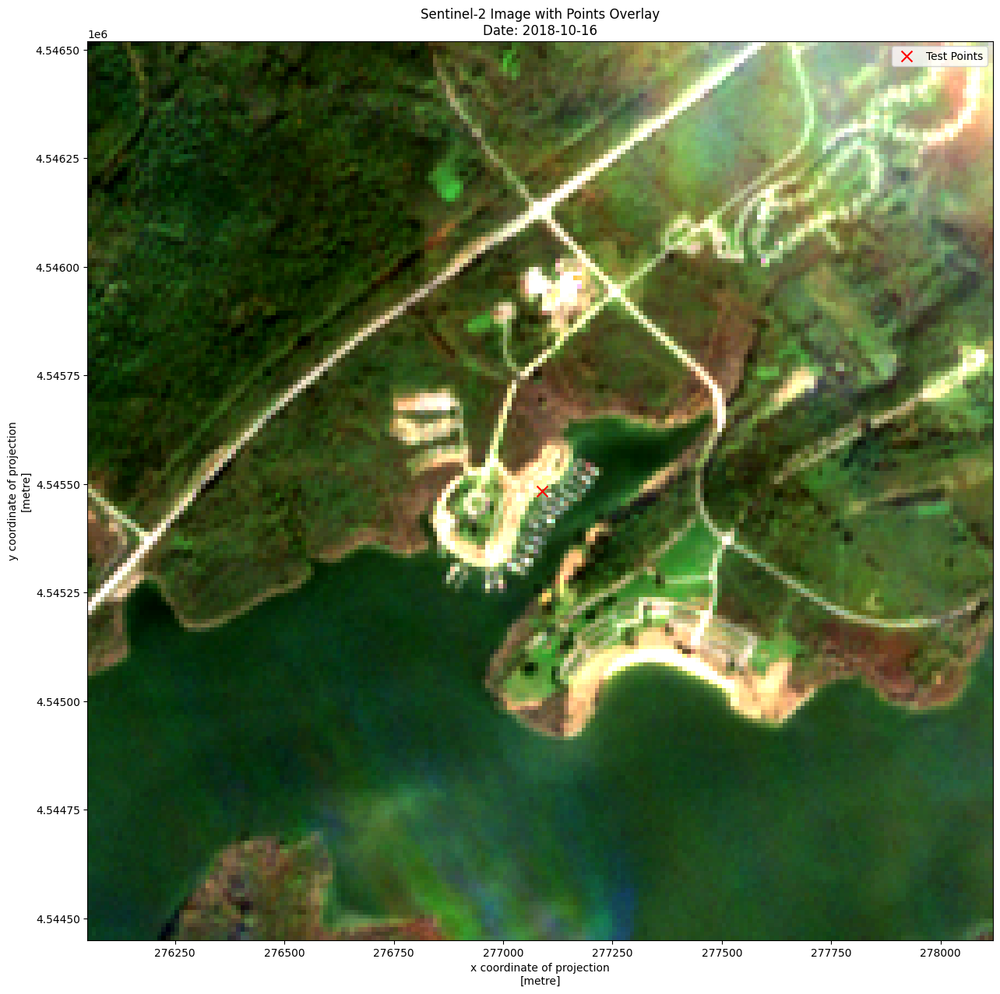

In [85]:
fig, ax = plt.subplots(figsize=(15, 15))

# Plot the satellite image
# robust=True handles color scaling so the image isn't too dark or bright
ds_clip.plot.imshow(ax=ax, rgb="band", robust=True)

# Plot the points on top
ax.scatter(xx, yy, c='red', s=100, marker='x', label='Test Points')

ax.set_title(f"Sentinel-2 Image with Points Overlay\nDate: {item.datetime.date()}")
plt.legend()
plt.show()

In [86]:
### Final setp

--- Starting Tile Extraction and Processing ---
Center Point (Lat/Lon): (41.0301, -77.6516)
Final Tile Dimension (10m pixels): 1024 x 1024
--- Clipping and Aligning Rasters ---
Clipped B04 (Reference): Shape (1, 1024, 1024)
Clipped B02: Shape (1, 1024, 1024)
Clipped B03: Shape (1, 1024, 1024)
Clipped B08: Shape (1, 1024, 1024)
Clipped visual: Shape (3, 1024, 1024)
Clipped B05: Shape (1, 1024, 1024)
Clipped B06: Shape (1, 1024, 1024)
Clipped B07: Shape (1, 1024, 1024)
Clipped B8A: Shape (1, 1024, 1024)
Clipped SCL: Shape (1, 1024, 1024)
Calculated NDVI: Shape (1024, 1024) (Range -1.0 to 1.0)
Calculated NDCI: Shape (1024, 1024) (Range -1.0 to 1.0)

Data successfully saved to: C:\Users\KostasPikounis\OneDrive_Inlecom_Personal\OneDrive - INLECOM\Amfitrite\task2\IWD\sat data test\case16762_abun0_7daysbeforeabun73k_1024_date2018-10-16


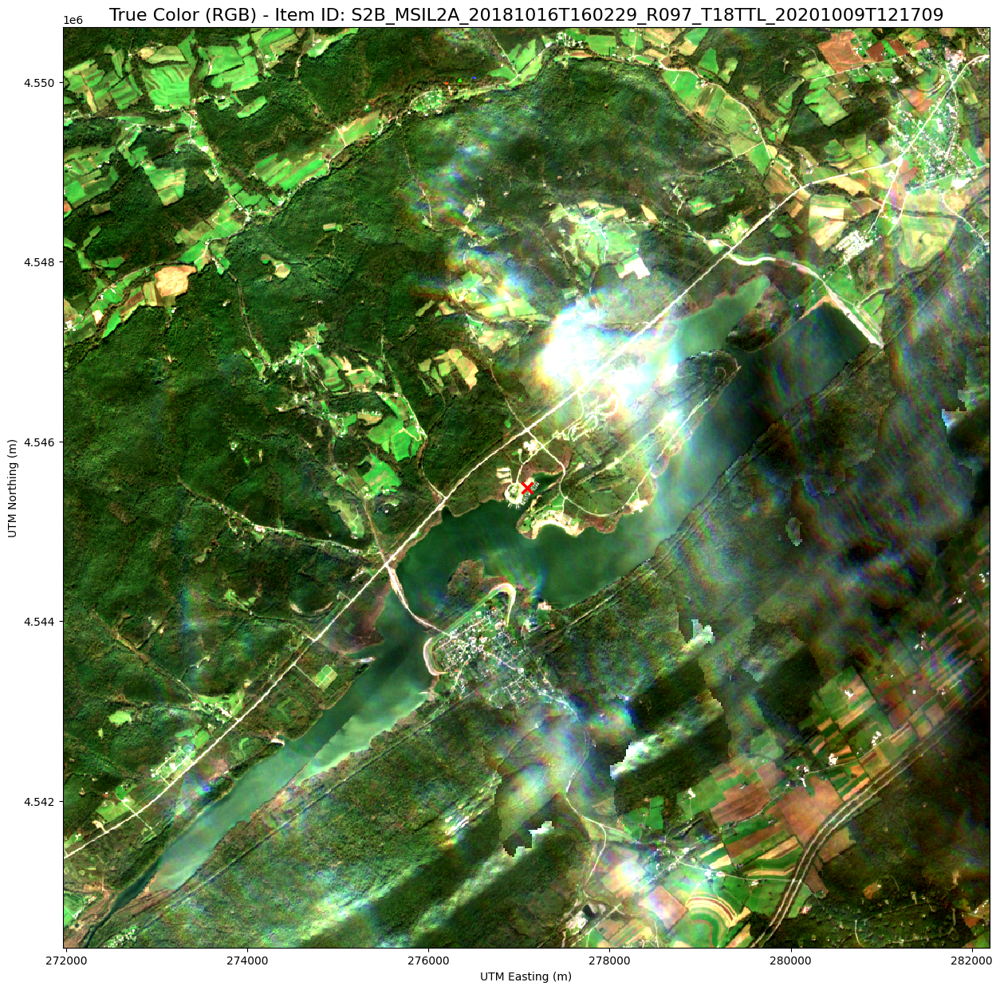

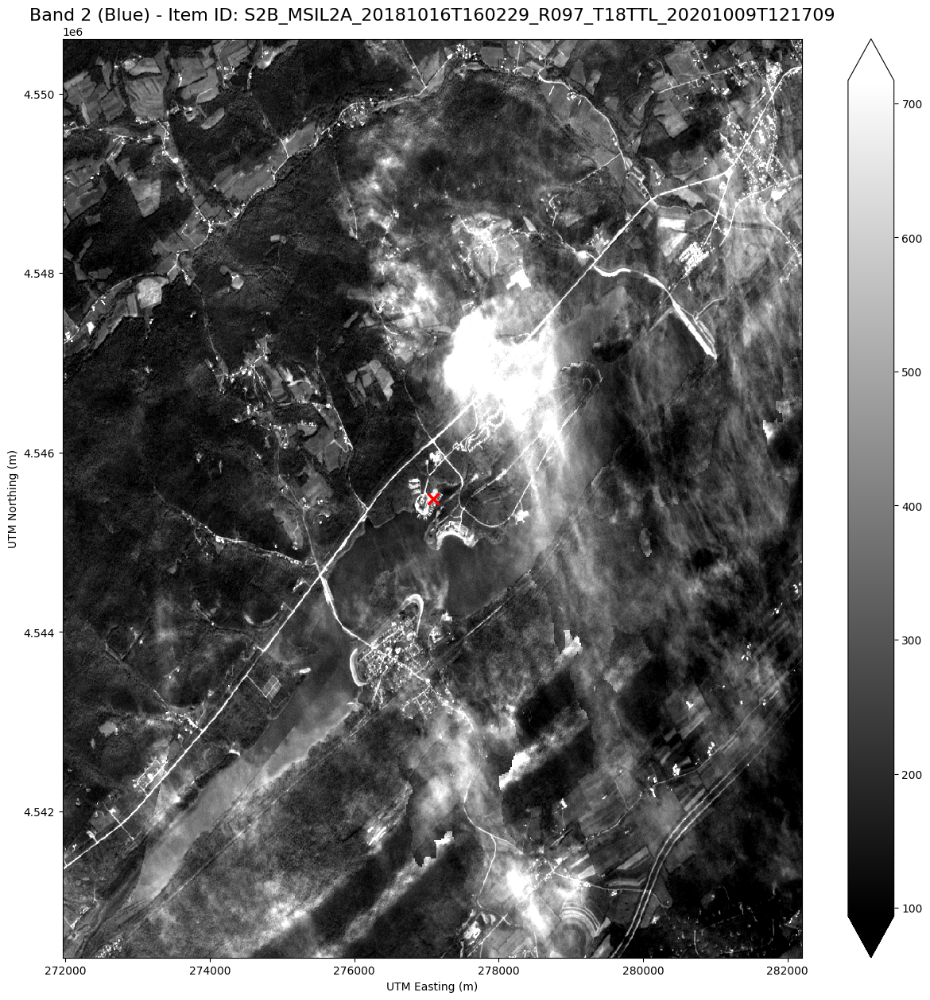

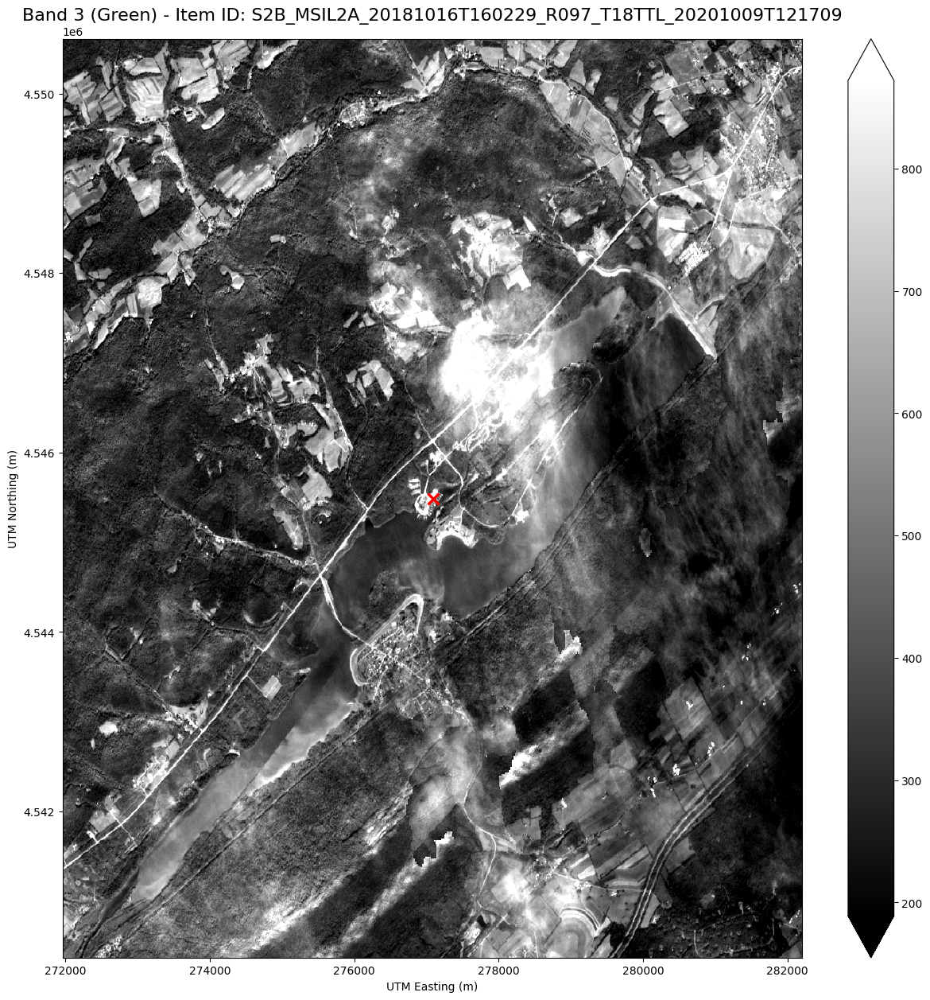

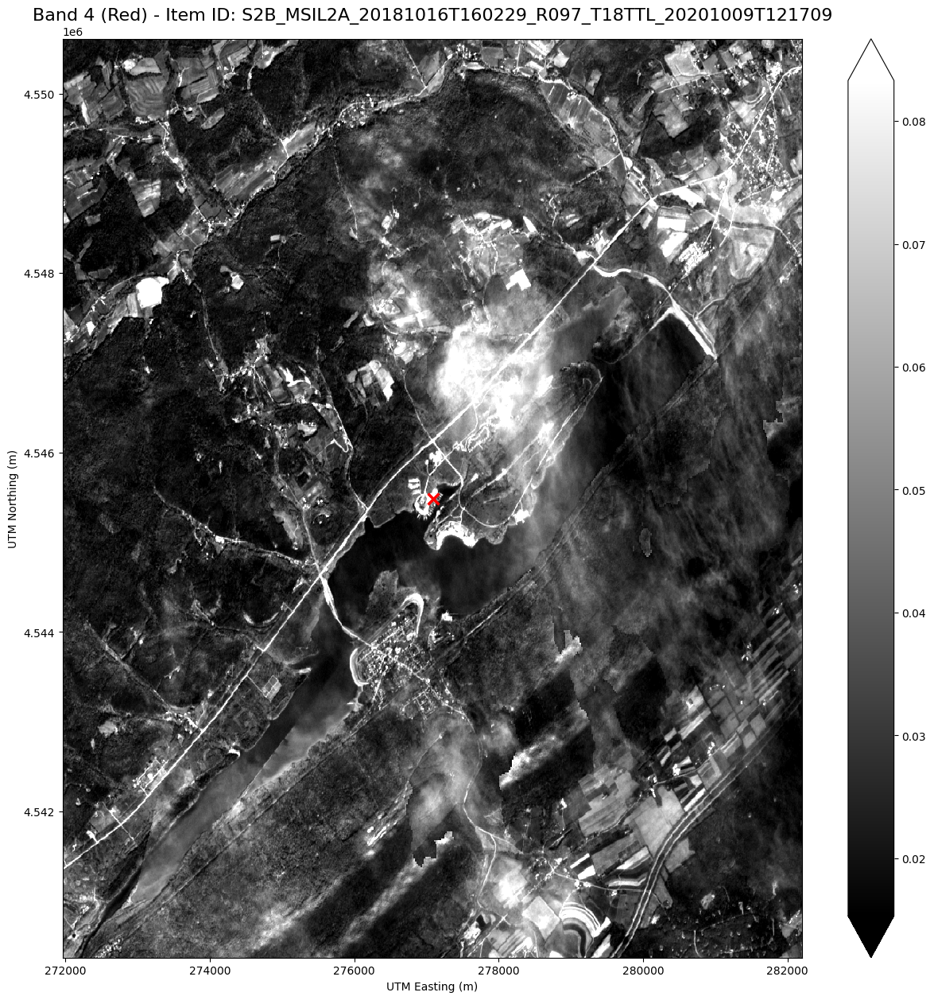

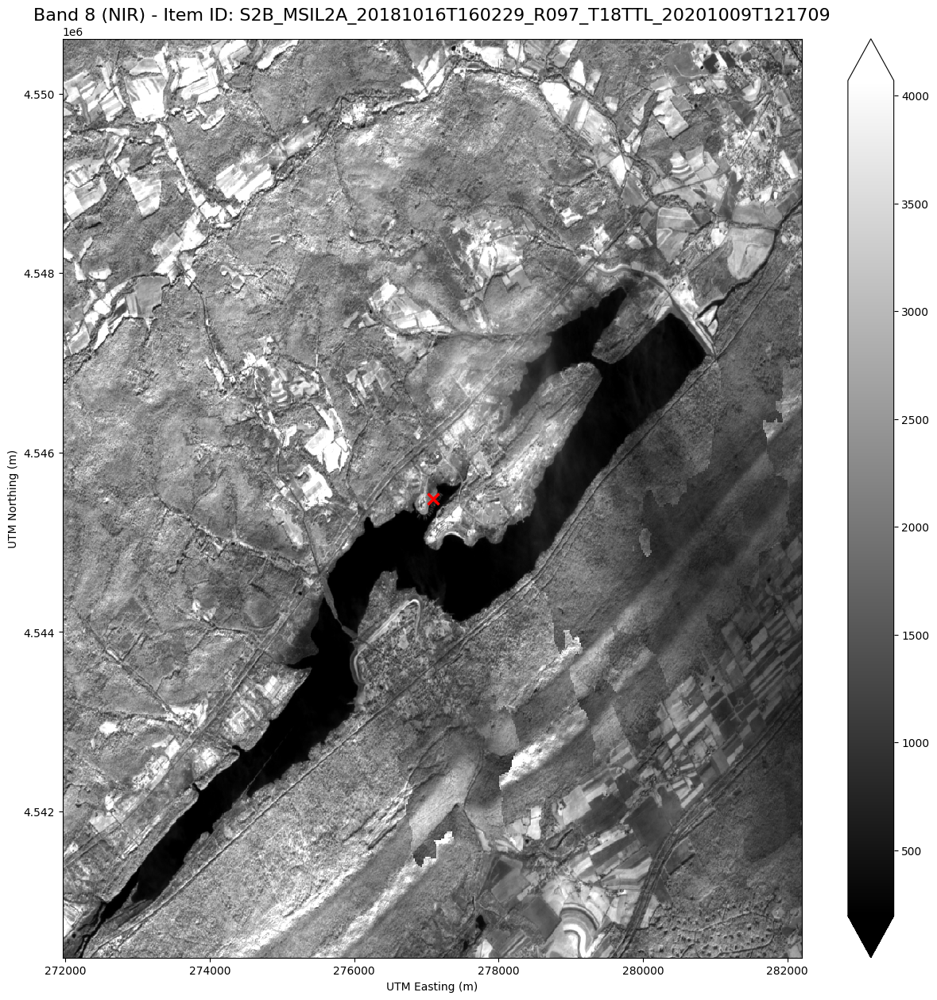

...

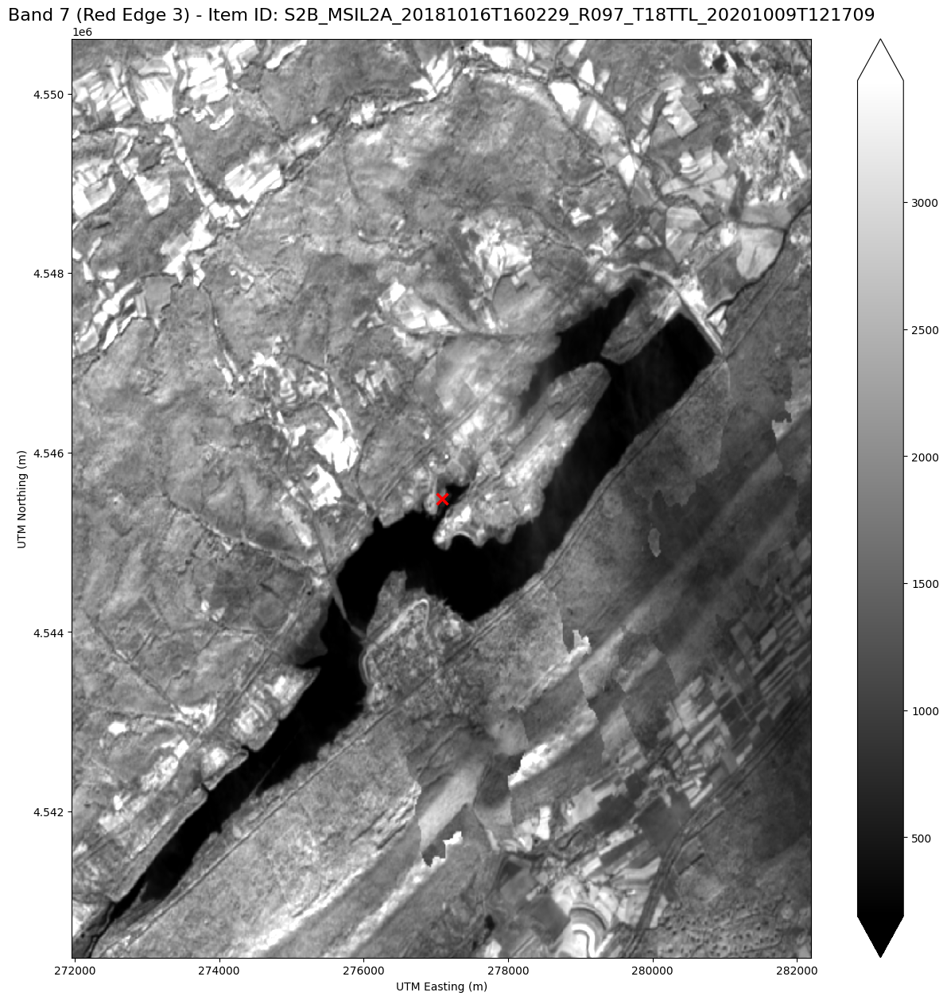

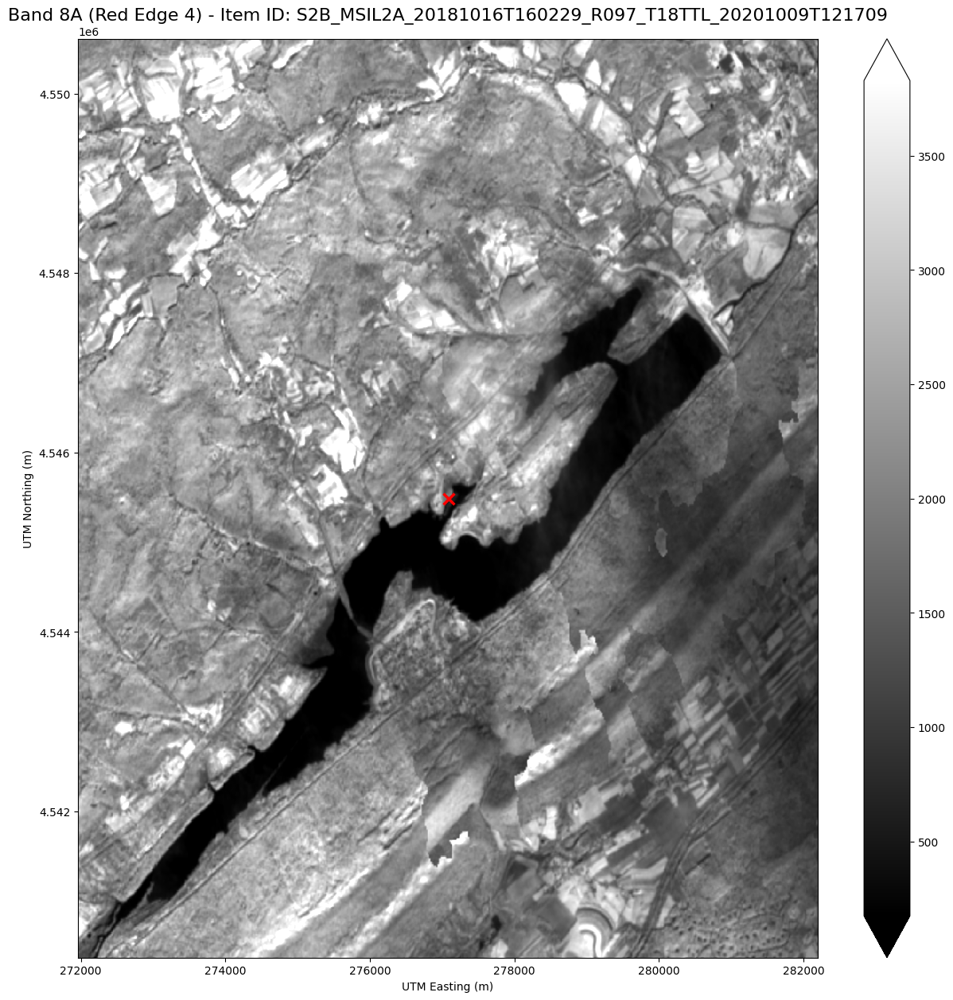

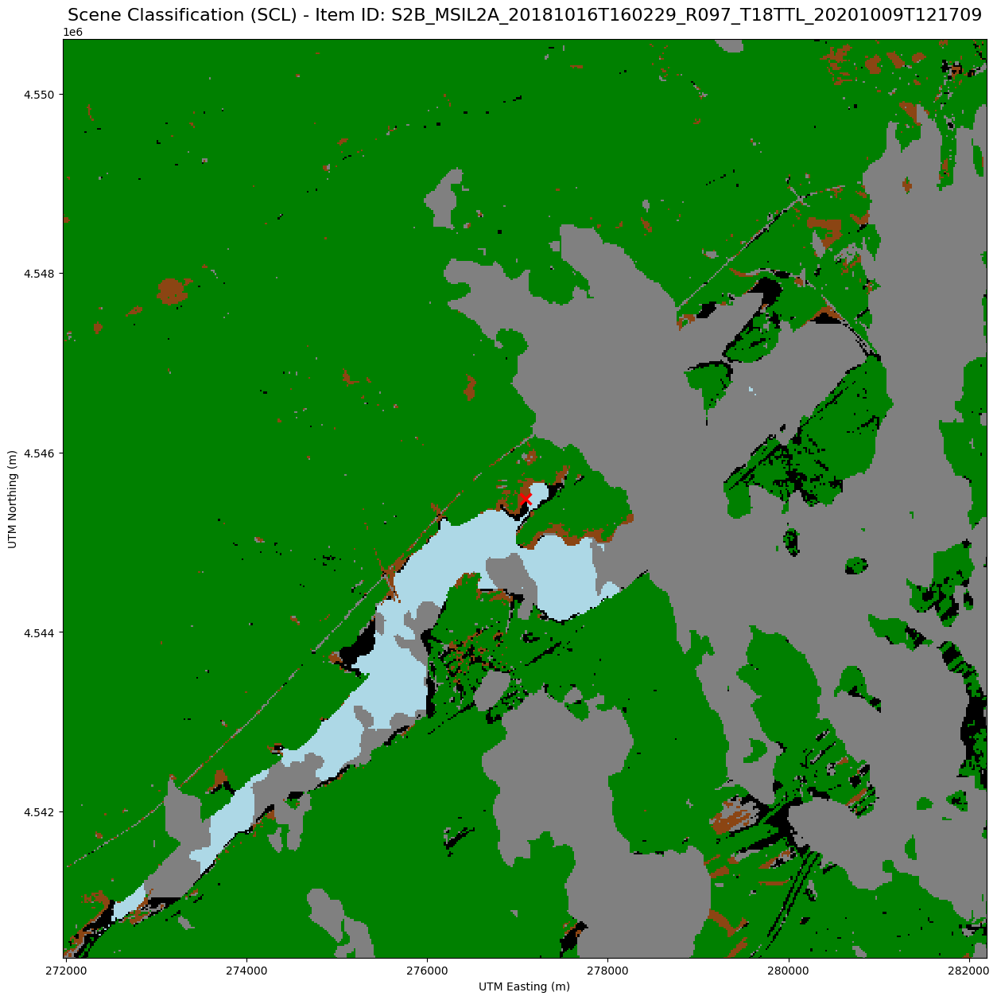

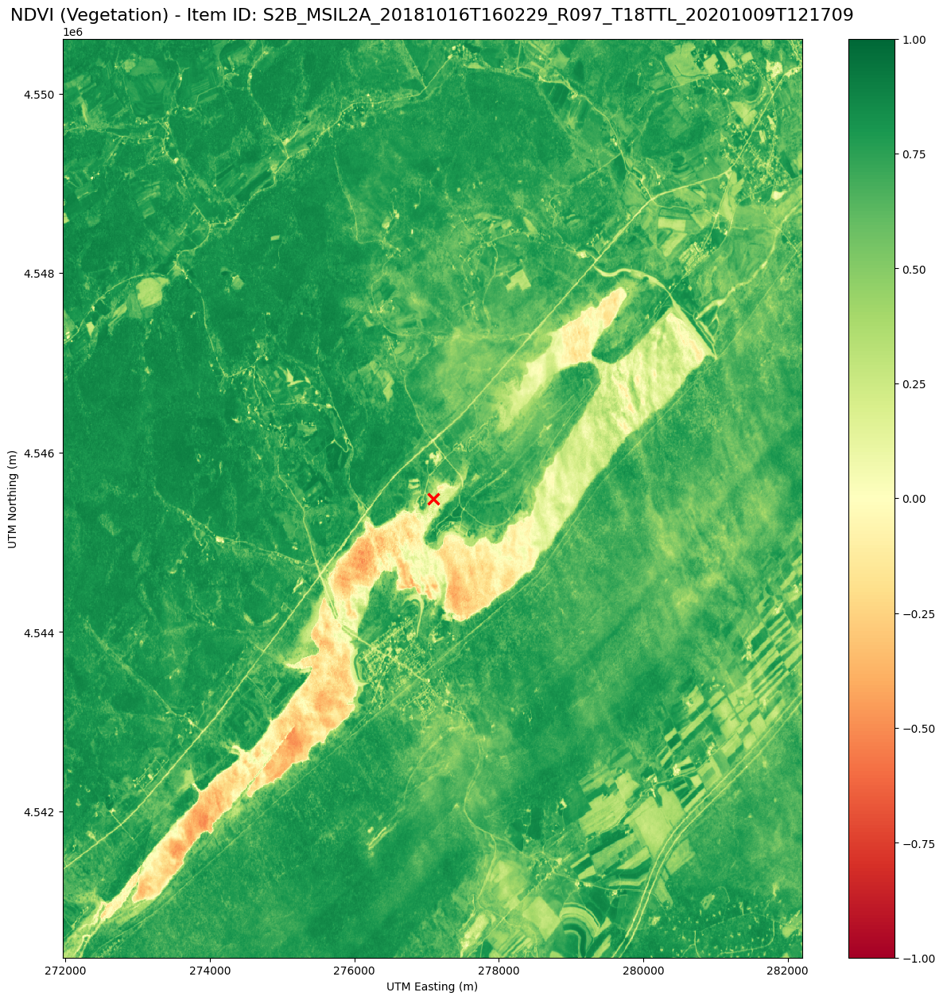

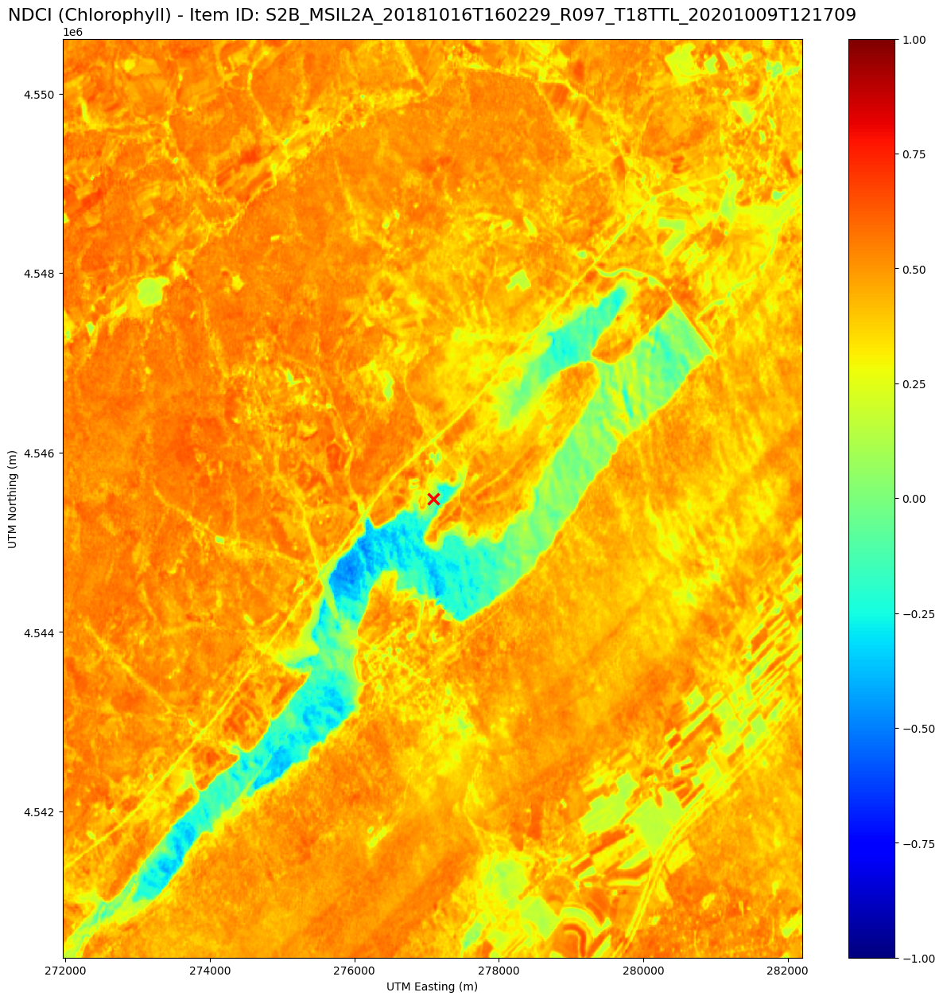


--- Individual image plots complete. ---


In [87]:
pixel_size = 1024
extract_and_save_tile(item, test_dates[['lat', 'lon']].copy(), initial_pixel_size=pixel_size, save_data = True, output_path = r"C:\Users\KostasPikounis\OneDrive_Inlecom_Personal\OneDrive - INLECOM\Amfitrite\task2\IWD\sat data test\case"+str(sel_case)+"_abun0_7daysbeforeabun73k_"+str(pixel_size)+"_date"+final_date)